In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from datetime import datetime
from datetime import timedelta
import matplotlib.ticker as ticker
import itertools
from numpy.lib import scimath as SM

In [2]:
'''Create empty Dataframe'''
my_index = pd.MultiIndex(levels=[[],[],[]],
                         codes=[[],[],[]],
                             names=[u'STime', u'Point', u'Index'])
my_columns = [u'Year', u'Month',u'Day',u'Hour',u'Minute',u'Second',u'x',u'y',u'theta',u'Record',u'U (m s^-1)',u'V (m s^-1)',u'W (m s^-1)',u'TSonic (K)',u'RH (%)',u'T_HMP60 (C)']
data = pd.DataFrame(index=my_index, columns=my_columns)

'''IMPORT DATA'''
files = ['08-00','08-30','09-00','09-30','10-00','10-30','11-00','11-30',
        '12-00','12-30','13-00','13-30','14-00','14-30','15-00','15-30',
        '16-00','16-30','17-00','17-30','18-00','18-30','19-00','19-30',
        '20-00','20-30','21-00','21-30','22-00','22-30','23-00','23-30',
        '00-00','00-30','01-00','01-30','02-00','02-30','03-00','03-30',
        '04-00','04-30','05-00','05-30','06-00','06-30','07-00','07-30']

for i in tqdm(files):
    temppd = pd.read_csv('./Data/Binned Data/'+i+'.csv',index_col=[0,1])
    
    #append dataframe into multiframe
    data = data.append(temppd.assign(k=i).set_index('k',append=True).swaplevel(0,2).swaplevel(1,2))
    
#data = data.sort_index() #sort cuz faster

100%|██████████| 48/48 [00:03<00:00, 14.04it/s]


In [4]:
def crosscorr(x,y,lag):
    
    xmean = np.mean(x)
    ymean = np.mean(y)
    N = len(x)
    cross = np.zeros((N,1))
    tot = 0
    
    for j in range(lag):
        temp1=0
        temp2=0
        temp3=0
        xk=0
        yk=0
        xkj=0
        ykj=0
        for k in range(N-j-1):
            xk+=1/(N-j)*x[k]
            yk+=1/(N-j)*y[k]
            xkj+=1/(N-j)*x[k+j]
            ykj+=1/(N-j)*y[k+j]
        for k in range(N-j-1):
            temp1 += (x[k]-xk)*(y[k+j]-ykj)
            temp2 += (x[k]-xk)*(y[k]-yk)
            temp3 += (x[k+j]-xkj)*(y[k+j]-ykj)
            
        cross[j]=temp1/(SM.sqrt(temp2)*SM.sqrt(temp3))
        
        
        '''print('temp1='+str(temp1)+','+str(SM.sqrt(temp1)))
        print('temp2='+str(temp2)+','+str(SM.sqrt(temp2)))
        print('temp3='+str(temp3)+','+str(SM.sqrt(temp3)))'''
        if np.sign(cross[0])!=np.sign(cross[j]):
            return sum(cross)
           
    return lag

def psum(x,sign):
    sum = 0
    sign = np.sign(x[0])
    if sign==-1:
        x = [ -i for i in x ]
    for i in range(len(x)):
        if x[i]<0:
            return sum*sign
        else:
            sum+=x[i]
    
    return sum*sign


points=['p1','p2','p3','p4','p5','p6','p7','p8']

my_index = pd.MultiIndex(levels=[[],[]],
                         codes=[[],[]],
                             names=[u'STime', u'Point'])
my_columns = [u'Uavg',u'Vavg',u'Wavg','Savg',u'TSonicavg',u'RHavg',u'T_HMP60avg',u'Uvar',u'Uvar_rerr',u'Vvar',u'Vvar_rerr',u'Wvar',u'Wvar_rerr',u'TSonicvar',u'TSonicvar_rerr',
              u'k',u'UVvar',u'UVvar_rerr',u'UWvar',u'UWvar_rerr',u'VWvar',u'VWvar_rerr',
              u'UTvar',u'UTvar_rerr',u'VTvar',u'VTvar_rerr',u'WTvar',u'WTvar_rerr',
             u'PMV1',u'PPD1',u'PMV2',u'PPD2',u'PMV3',u'PPD3',u'PMV4',u'PPD4',u'PMV5',u'PPD5',u'PMV6',u'PPD6',]

p_data = pd.DataFrame(index=my_index, columns=my_columns)

timeScale = [];

NIntegral = 600
AverageSample = len(data.loc[('08-00','p1'),'U (m s^-1)'])
WindowLength=int(AverageSample/2)
dt=0.1
SampleTime=AverageSample/10.

RUU=np.zeros((NIntegral,1))
RVV=np.zeros((NIntegral,1))
RWW=np.zeros((NIntegral,1))
RTT=np.zeros((NIntegral,1))
RUV=np.zeros((NIntegral,1))
RVW=np.zeros((NIntegral,1))
RUW=np.zeros((NIntegral,1))
RUT=np.zeros((NIntegral,1))
RVT=np.zeros((NIntegral,1))
RWT=np.zeros((NIntegral,1))

RUUALL=np.zeros((WindowLength,1))
RVVALL=np.zeros((WindowLength,1))
RWWALL=np.zeros((WindowLength,1))
RTTALL=np.zeros((WindowLength,1))
RUVALL=np.zeros((WindowLength,1))
RVWALL=np.zeros((WindowLength,1))
RUWALL=np.zeros((WindowLength,1))
RUTALL=np.zeros((WindowLength,1))
RVTALL=np.zeros((WindowLength,1))
RWTALL=np.zeros((WindowLength,1))


for dtime in tqdm(files):
    for point in points:
        p_data.loc[(dtime,point),'Uavg'] = np.mean(data.loc[(dtime,point),'U (m s^-1)'])
        p_data.loc[(dtime,point),'Vavg'] = np.mean(data.loc[(dtime,point),'V (m s^-1)'])
        p_data.loc[(dtime,point),'Wavg'] = np.mean(data.loc[(dtime,point),'W (m s^-1)'])
        p_data.loc[(dtime,point),'TSonicavg'] = np.mean(data.loc[(dtime,point),'TSonic (K)'])-273.15 #shift to Celcius
        p_data.loc[(dtime,point),'RHavg'] = np.mean(data.loc[(dtime,point),'RH (%)'])
        p_data.loc[(dtime,point),'T_HMP60avg'] = np.mean(data.loc[(dtime,point),'T_HMP60 (C)']) 
        p_data.loc[(dtime,point),'Savg'] = np.mean(np.sqrt(data.loc[(dtime,point),'U (m s^-1)']**2+
                                                           data.loc[(dtime,point),'V (m s^-1)']**2+
                                                           data.loc[(dtime,point),'W (m s^-1)']**2))
        
        
        x = [j for j in range(0, len(data.loc[(dtime,point),'U (m s^-1)']))]
        U = data.loc[(dtime,point),'U (m s^-1)']
        Umodel = np.polyfit(x,U,1)
        Utrend = np.polyval(Umodel,x)
        Udetrended = U - Utrend
        V = data.loc[(dtime,point),'V (m s^-1)']
        Vmodel = np.polyfit(x,V,1)
        Vtrend = np.polyval(Vmodel,x)
        Vdetrended = V - Vtrend
        W = data.loc[(dtime,point),'W (m s^-1)']
        Wmodel = np.polyfit(x,W,1)
        Wtrend = np.polyval(Wmodel,x)
        Wdetrended = W - Wtrend
        TSonic =  data.loc[(dtime,point),'TSonic (K)']
        TSonicmodel = np.polyfit(x, TSonic,1)
        TSonictrend = np.polyval( TSonicmodel,x)
        TSonicdetrended =  TSonic -  TSonictrend
        
        UVCovMatrix = np.cov(Udetrended, Vdetrended)
        UWCovMatrix = np.cov(Udetrended, Wdetrended)
        VWCovMatrix = np.cov(Vdetrended, Wdetrended)
        UTSonicCovMatrix = np.cov(Udetrended, TSonicdetrended)
        VTSonicCovMatrix = np.cov(Vdetrended, TSonicdetrended)
        WTSonicCovMatrix = np.cov(Wdetrended, TSonicdetrended)

        p_data.loc[(dtime,point),'Uvar'] = UVCovMatrix[0,0]
        p_data.loc[(dtime,point),'Vvar'] = UVCovMatrix[1,1]
        p_data.loc[(dtime,point),'Wvar'] = UWCovMatrix[1,1]
        p_data.loc[(dtime,point),'TSonicvar'] = UTSonicCovMatrix[1,1]
        p_data.loc[(dtime,point),'k'] = 1/2*(p_data.loc[(dtime,point),'Uvar']+p_data.loc[(dtime,point),'Vvar']+p_data.loc[(dtime,point),'Wvar'])

        p_data.loc[(dtime,point),'UVvar'] = UVCovMatrix[0,1]
        p_data.loc[(dtime,point),'UWvar'] = UWCovMatrix[0,1]
        p_data.loc[(dtime,point),'VWvar'] = VWCovMatrix[0,1]
        p_data.loc[(dtime,point),'UTvar'] = UTSonicCovMatrix[0,1]
        p_data.loc[(dtime,point),'VTvar'] = VTSonicCovMatrix[0,1]
        p_data.loc[(dtime,point),'WTvar'] = WTSonicCovMatrix[0,1]
        
        Udetrended = Udetrended.to_numpy()
        Vdetrended = Vdetrended.to_numpy()
        Wdetrended = Wdetrended.to_numpy()
        TSonicdetrended = TSonicdetrended.to_numpy()
        
        TauUU = crosscorr(Udetrended,Udetrended, NIntegral)*dt
        TauVV = crosscorr(Vdetrended,Vdetrended, NIntegral)*dt
        TauWW = crosscorr(Wdetrended,Wdetrended, NIntegral)*dt
        TauTT = crosscorr(TSonicdetrended,TSonicdetrended, NIntegral)*dt
        TauUV = crosscorr(Udetrended,Vdetrended, NIntegral)*dt
        TauUW = crosscorr(Udetrended,Wdetrended, NIntegral)*dt
        TauVW = crosscorr(Vdetrended,Wdetrended, NIntegral)*dt
        TauUT = crosscorr(Udetrended,TSonicdetrended, NIntegral)*dt
        TauVT = crosscorr(Vdetrended,TSonicdetrended, NIntegral)*dt
        TauWT = crosscorr(Wdetrended,TSonicdetrended, NIntegral)*dt
        
        
        p_data.loc[(dtime,point),'Uvar'] *=2*TauUU/SampleTime+1
        p_data.loc[(dtime,point),'Vvar'] *=2*TauVV/SampleTime+1
        p_data.loc[(dtime,point),'Wvar'] *=2*TauWW/SampleTime+1
        p_data.loc[(dtime,point),'TSonicvar'] *=2*TauTT/SampleTime+1
        p_data.loc[(dtime,point),'UVvar'] *=2*TauUV/SampleTime+1
        p_data.loc[(dtime,point),'UWvar'] *=2*TauUW/SampleTime+1
        p_data.loc[(dtime,point),'VWvar'] *=2*TauVW/SampleTime+1
        p_data.loc[(dtime,point),'UTvar'] *=2*TauUT/SampleTime+1
        p_data.loc[(dtime,point),'VTvar'] *=2*TauVT/SampleTime+1
        p_data.loc[(dtime,point),'WTvar'] *=2*TauWT/SampleTime+1
        
        
        timeScale = np.append(timeScale, [TauUU[0],TauVV[0],TauWW[0],TauTT[0],TauUV[0],TauUW[0],TauVW[0],TauUT[0],TauVT[0],TauWT[0]])
        #print(timeScale)
        
        p_data.loc[(dtime,point),'Uvar_rerr'] =np.sqrt(2*TauUU/SampleTime)
        p_data.loc[(dtime,point),'Vvar_rerr'] =np.sqrt(2*TauVV/SampleTime)
        p_data.loc[(dtime,point),'Wvar_rerr'] =np.sqrt(2*TauWW/SampleTime)
        p_data.loc[(dtime,point),'TSonicvar_rerr'] =np.sqrt(2*TauTT/SampleTime)
        p_data.loc[(dtime,point),'UVvar_rerr'] =np.sqrt(2*TauUV/SampleTime)
        p_data.loc[(dtime,point),'UWvar_rerr'] =np.sqrt(2*TauUW/SampleTime)
        p_data.loc[(dtime,point),'VWvar_rerr'] =np.sqrt(2*TauVW/SampleTime)
        p_data.loc[(dtime,point),'UTvar_rerr'] =np.sqrt(2*TauUT/SampleTime)
        p_data.loc[(dtime,point),'VTvar_rerr'] =np.sqrt(2*TauVT/SampleTime)
        p_data.loc[(dtime,point),'WTvar_rerr'] =np.sqrt(2*TauWT/SampleTime)

    
#print(p_data)

  0%|          | 0/48 [00:00<?, ?it/s]<ipython-input-4-ef3156f5f4c8>:27: ComplexWarning: Casting complex values to real discards the imaginary part
  cross[j]=temp1/(SM.sqrt(temp2)*SM.sqrt(temp3))
  8%|▊         | 4/48 [00:55<10:09, 13.85s/it]<ipython-input-4-ef3156f5f4c8>:184: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'VWvar_rerr'] =np.sqrt(2*TauVW/SampleTime)
 23%|██▎       | 11/48 [02:45<09:19, 15.13s/it]<ipython-input-4-ef3156f5f4c8>:187: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'WTvar_rerr'] =np.sqrt(2*TauWT/SampleTime)
 29%|██▉       | 14/48 [03:28<08:26, 14.90s/it]<ipython-input-4-ef3156f5f4c8>:182: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'UVvar_rerr'] =np.sqrt(2*TauUV/SampleTime)
 38%|███▊      | 18/48 [04:31<07:43, 15.44s/it]<ipython-input-4-ef3156f5f4c8>:183: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'UWvar_rerr'] =np.sqrt(2*TauUW/Samp

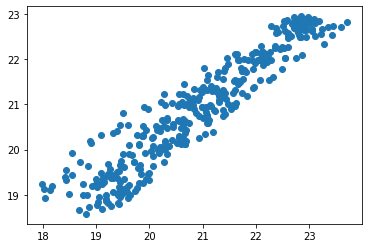

In [5]:
plt.scatter(p_data['TSonicavg']**2*0.0056+0.8097*p_data['TSonicavg']+0.4548, p_data['T_HMP60avg'])
plt.show()

p_data['TSonicavg']=p_data['TSonicavg']**2*0.0056+0.8097*p_data['TSonicavg']+0.4548


(array([3172.,  387.,  111.,   52.,   37.,   16.,    6.,    6.]),
 array([ 0,  8, 16, 24, 32, 40, 48, 56, 64]),
 <BarContainer object of 8 artists>)

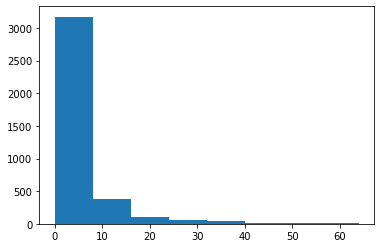

In [6]:
plt.hist(timeScale, bins = [0,8,16,24,32,40,48,56,64])

In [7]:
timeScale = np.sort(timeScale)
print(len(timeScale))
print(next(x[0] for x in enumerate(timeScale) if x[1] > 16)/len(timeScale))
print(timeScale[-100])

3840
0.93125
32.2530930600626


In [8]:
def calculatePmv(ta, tr, vel, rh, met, clo, wme):
      #returns [pmv, ppd]
      #ta, air temperature (°C)
      #tr, mean radiant temperature (°C)
      #vel, relative air speed (m/s)
      #rh, relative humidity (%) Used only this way to input humidity level
      #met, metabolic rate (met)
      #clo, clothing (clo)
      #wme, external work, normally around 0 (met)

    pa = rh * 10 * np.exp(16.6536 - 4030.183 / (ta + 235))
    
    icl = 0.155 * clo #thermal insulation of the clothing in M2K/W
    m = met * 58.15 #metabolic rate in W/M2
    w = wme * 58.15 #external work in W/M2
    mw = m - w #internal heat production in the human body
    
    fcl = 1 + 1.29 * icl if icl <= 0.078 else 1.05 + 0.645 * icl

    #heat transf. coeff. by forced convection
    hcf = 12.1 * np.sqrt(vel)
    taa = ta + 273
    tra = tr + 273
    #we have verified that using the equation below or this tcla = taa + (35.5 - ta) / (3.5 * (6.45 * icl + .1)) does not affect the PMV value
    tcla = taa + (35.5 - ta) / (3.5 * icl + 0.1)

    p1 = icl * fcl
    p2 = p1 * 3.96
    p3 = p1 * 100
    p4 = p1 * taa
    p5 = 308.7 - 0.028 * mw + p2 * (tra / 100) ** 4

    xn = tcla / 100
    xf = tcla / 50
    eps = 0.00015

    n = 0
    hc = 0
    while (np.abs(xn - xf) > eps):
        xf = (xf + xn) / 2
        hcn = 2.38 * np.abs(100.0 * xf - taa) ** 0.25
        hc = hcf if hcf > hcn else hcn

        xn = (p5 + p4 * hc - p2 * xf ** 4) / (100 + p3 * hc)
        n+=1
        if (n > 150):
            print("Max iterations exceeded")
            return 1
        
    

    tcl = 100 * xn - 273;

    #heat loss diff. through skin
    hl1 = 3.05 * 0.001 * (5733 - 6.99 * mw - pa)
    #heat loss by sweating
    hl2 = 0.42 * (mw - 58.15) if (mw > 58.15) else 0
    #latent respiration heat loss
    hl3 = 1.7 * 0.00001 * m * (5867 - pa)
    #dry respiration heat loss
    hl4 = 0.0014 * m * (34 - ta)
    #heat loss by radiation
    hl5 = 3.96 * fcl * (xn ** 4 - (tra / 100) ** 4)
    #heat loss by convection
    hl6 = fcl * hc * (tcl - ta)

    ts = 0.303 * np.exp(-0.036 * m) + 0.028
    pmv = ts * (mw - hl1 - hl2 - hl3 - hl4 - hl5 - hl6)
    ppd = 100.0 - 95.0 * np.exp(-0.03353 * pmv ** 4.0 - 0.2179 * pmv ** 2.0)

    return [pmv,ppd]






for dtime in tqdm(files):
    for point in points:
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.57, 0)
        p_data.loc[(dtime,point),'PMV1'] = PMV[0]
        p_data.loc[(dtime,point),'PPD1'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.74, 0)
        p_data.loc[(dtime,point),'PMV2'] = PMV[0]
        p_data.loc[(dtime,point),'PPD2'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.96, 0)
        p_data.loc[(dtime,point),'PMV3'] = PMV[0]
        p_data.loc[(dtime,point),'PPD3'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.57, 0)
        p_data.loc[(dtime,point),'PMV4'] = PMV[0]
        p_data.loc[(dtime,point),'PPD4'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.74, 0)
        p_data.loc[(dtime,point),'PMV5'] = PMV[0]
        p_data.loc[(dtime,point),'PPD5'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.96, 0)
        p_data.loc[(dtime,point),'PMV6'] = PMV[0]
        p_data.loc[(dtime,point),'PPD6'] = PMV[1]

100%|██████████| 48/48 [00:01<00:00, 45.11it/s]


In [9]:
p_data.loc[('19-30','p3'),:]=np.nan
p_data.loc[('19-30','p4'),:]=np.nan

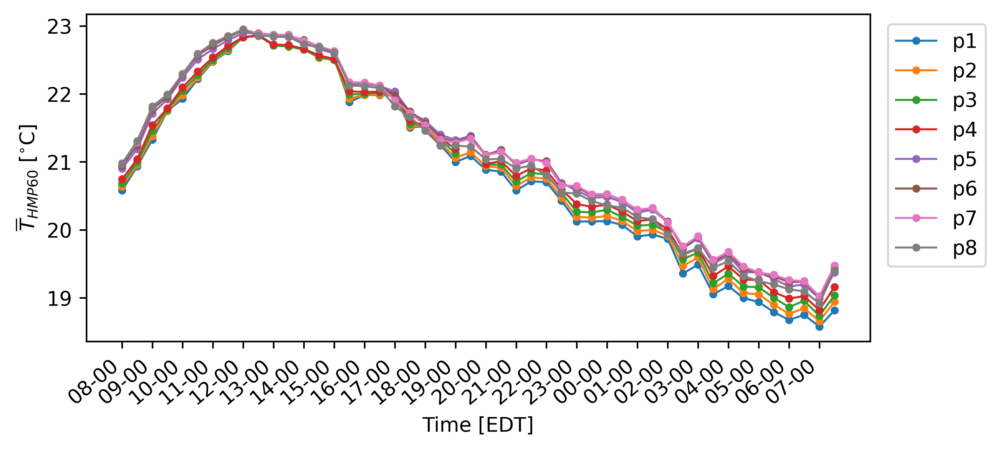

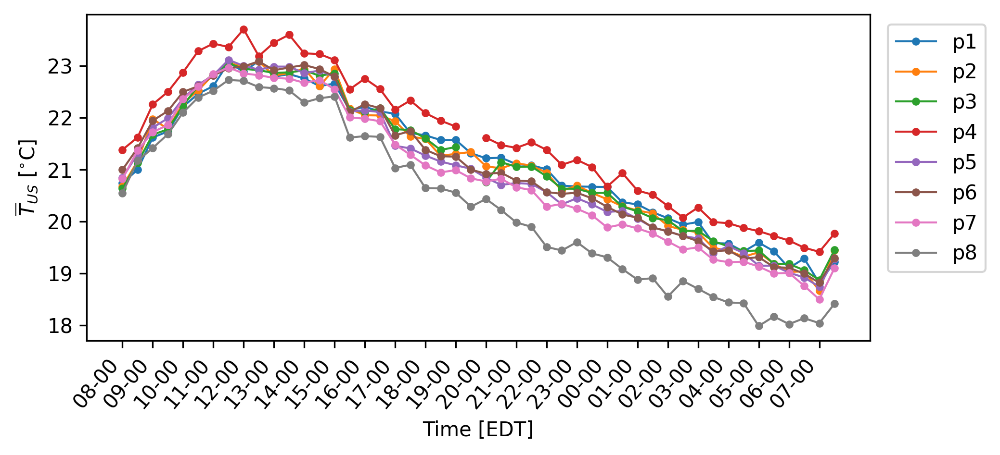

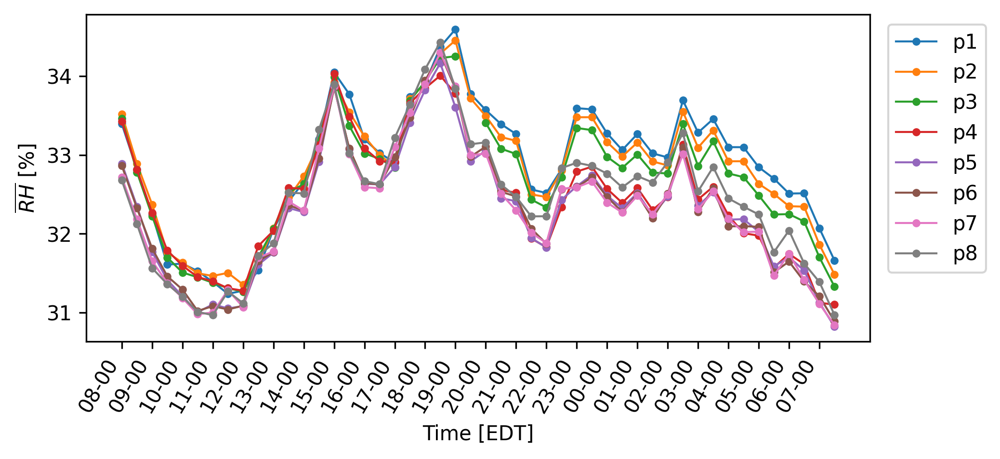

In [10]:
figsavepath = './Analysis/Figures/24Hr_'
points = ['p1','p2','p3','p4','p5','p6','p7','p8']

x_axis_labels = ['16-00','17-00','18-00','19-00',
            '20-00','21-00','22-00','23-00',
            '00-00','01-00','02-00','03-00',
            '04-00','05-00','06-00','07-00',
            '08-00','09-00','10-00','11-00',
            '12-00','13-00','14-00','15-00']

marker = itertools.cycle(('.'))
colors = {'p1':'b'}



fig = plt.figure(figsize=(7,3),dpi=600)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'T_HMP60avg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{T}_{HMP60}$ [$^{\circ}$C]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=40,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_HMP60_T_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'TSonicavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{T}_{US}$ [$^{\circ}$C]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_SonicT_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'RHavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{RH}$ [%]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=60,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_RH_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

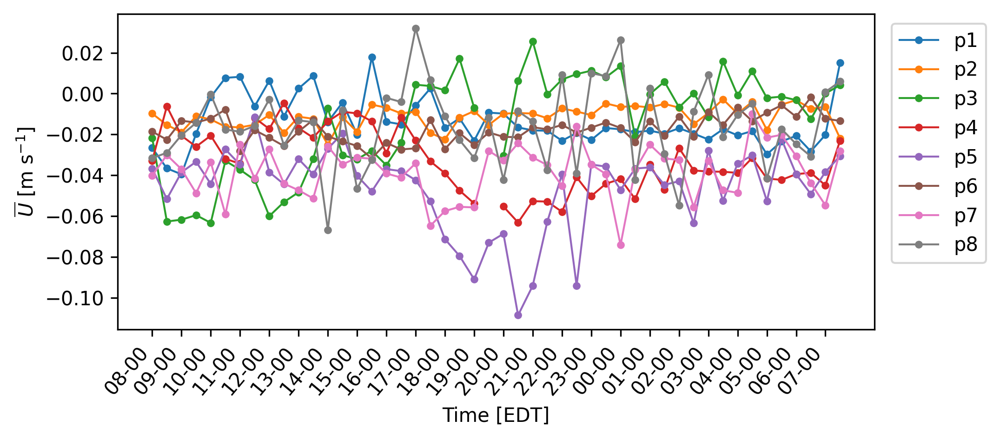

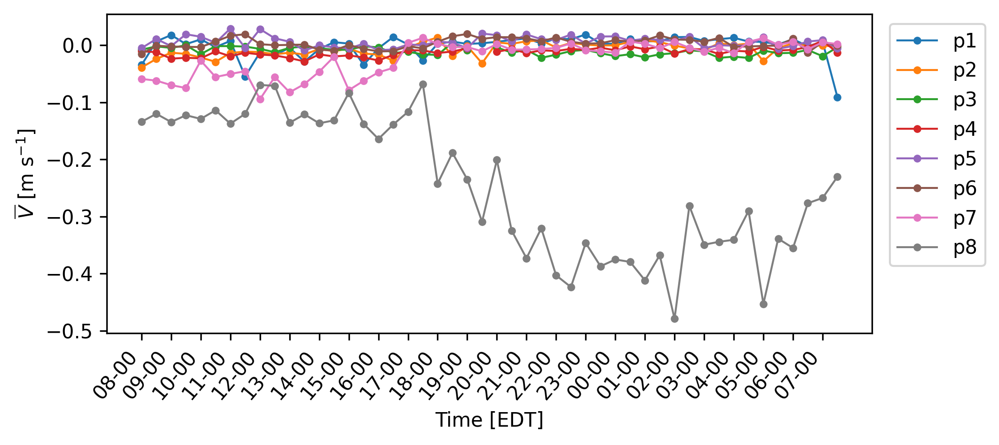

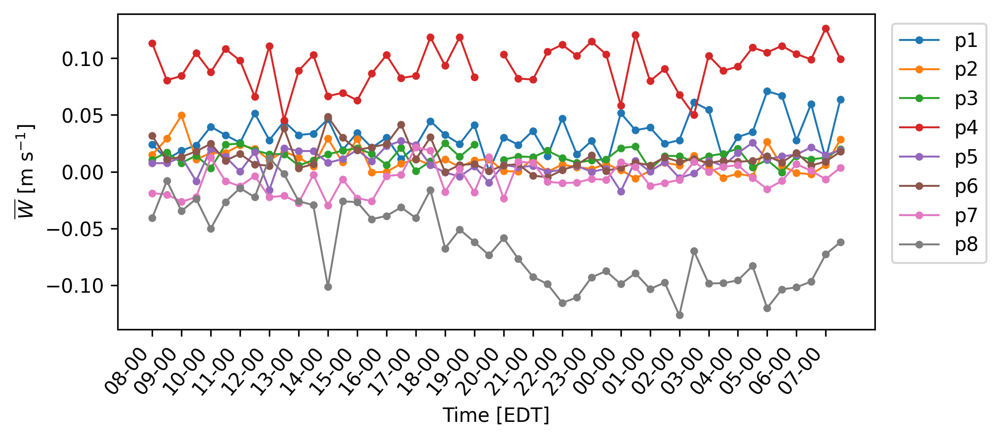

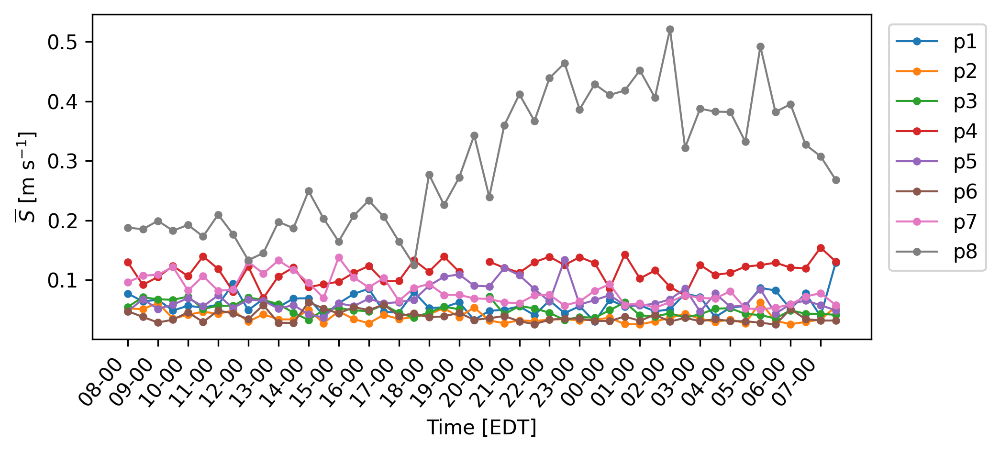

In [11]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Uavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{U}$ [m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_U_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Vavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{V}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_V_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Wavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{W}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_W_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Savg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{S}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_S_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

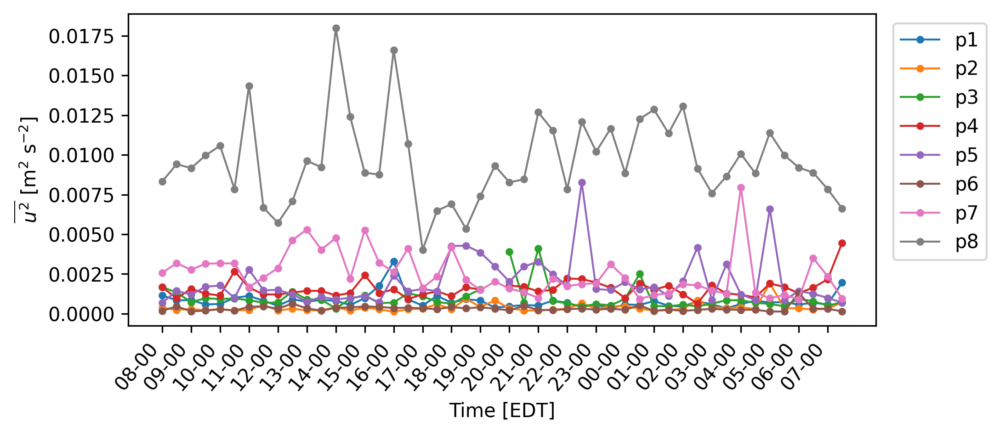

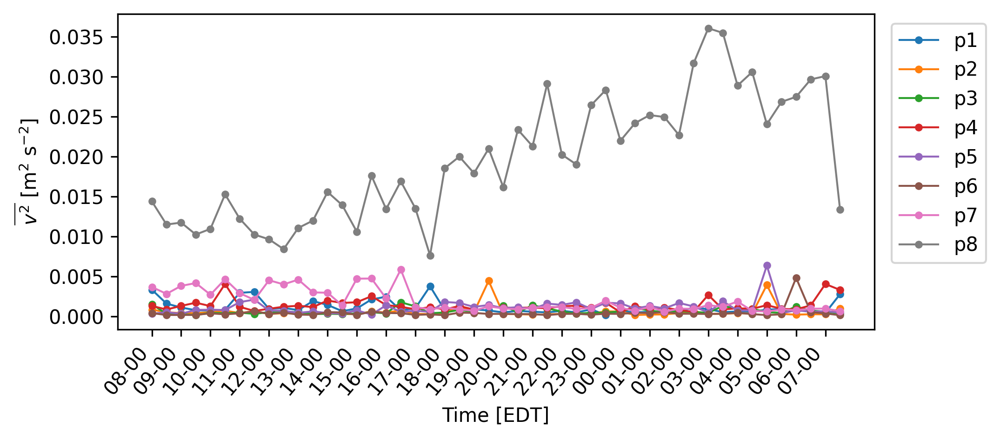

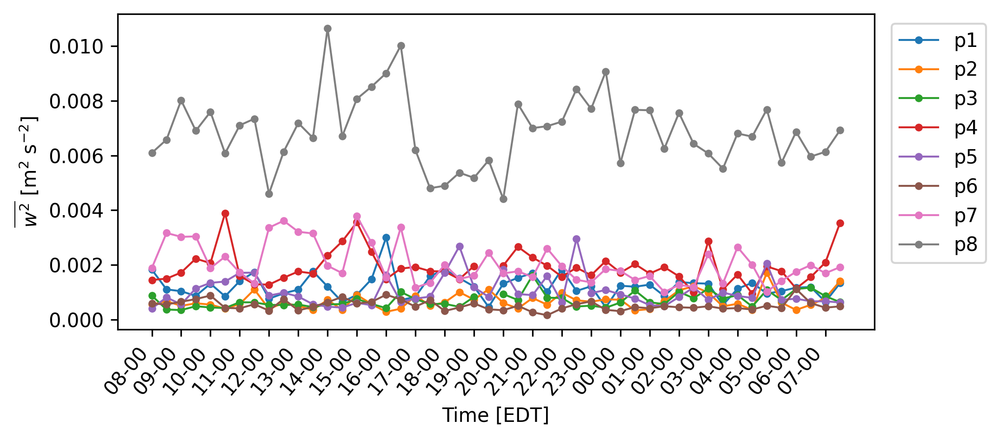

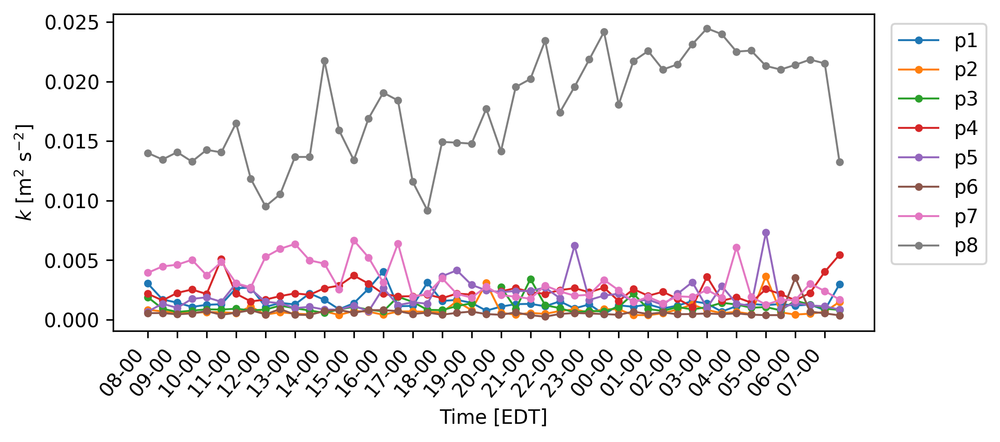

In [12]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Uvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{u^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Uvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Vvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{v^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Vvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Wvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{w^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Wvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'k'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$k$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_k.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

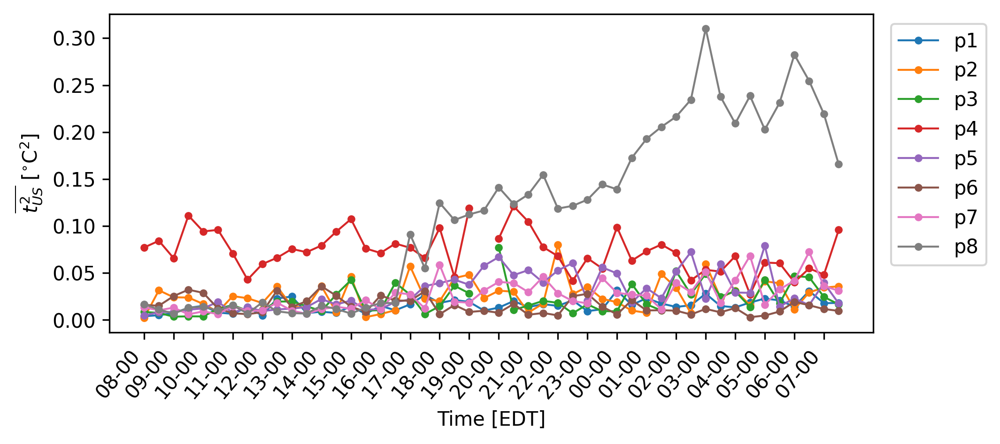

In [13]:
DeltaT=np.max(p_data['TSonicavg'])-np.min(p_data['TSonicavg'])
#print(DeltaT)

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'TSonicvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{t_{US}^2}$ [$^{\circ}$C$^2$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_TSonicvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


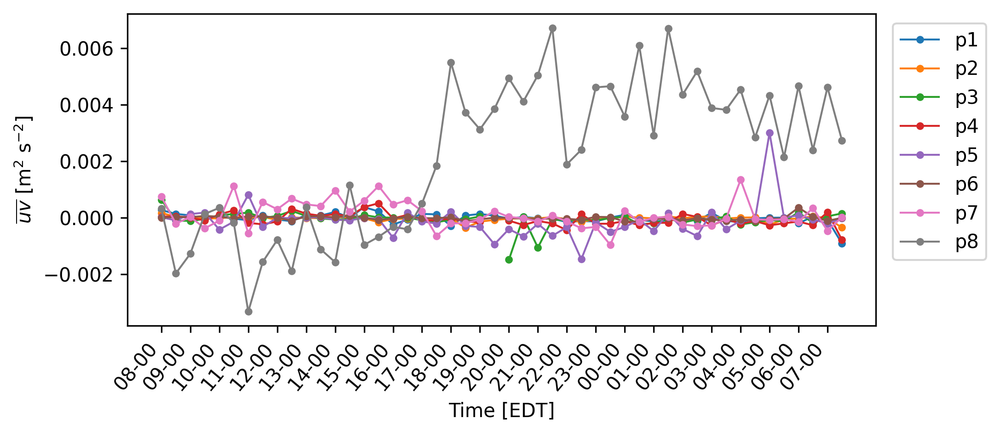

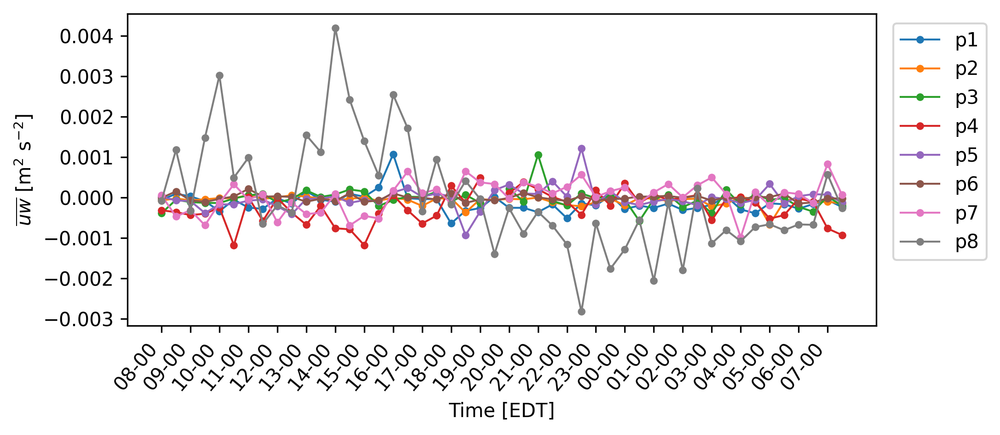

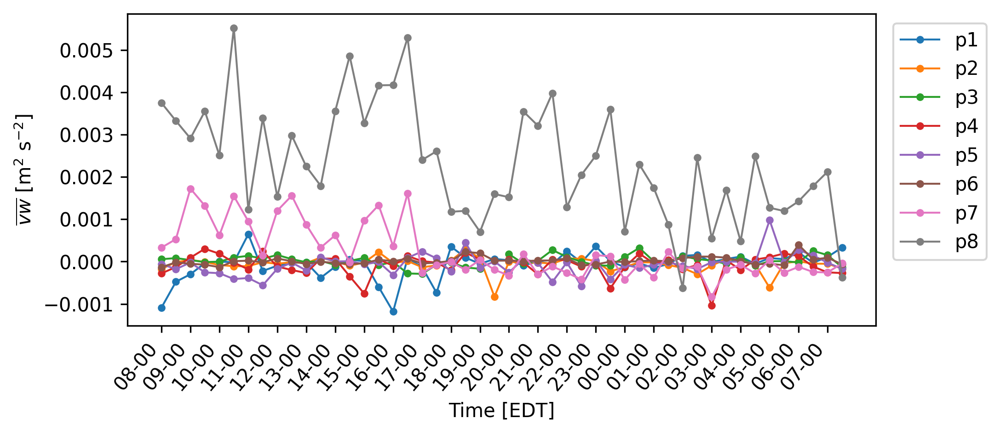

In [14]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UVvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{uv}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UVvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UWvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{uw}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UWvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'VWvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{vw}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_VWvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

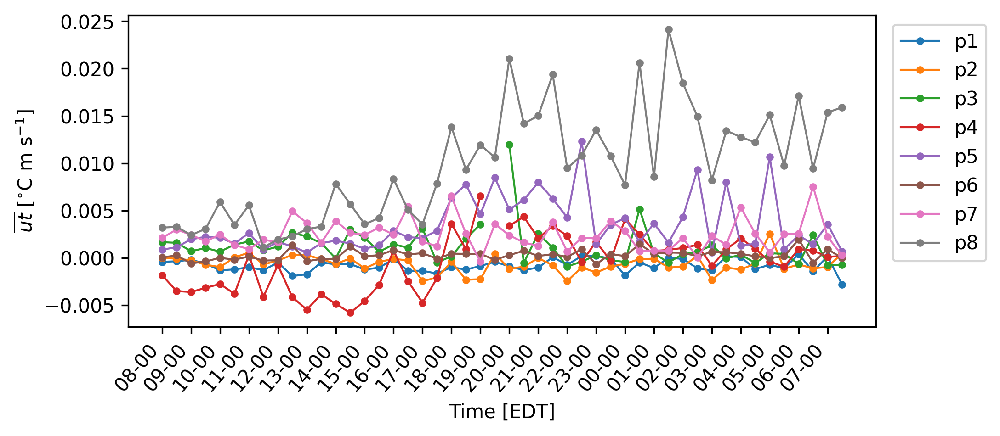

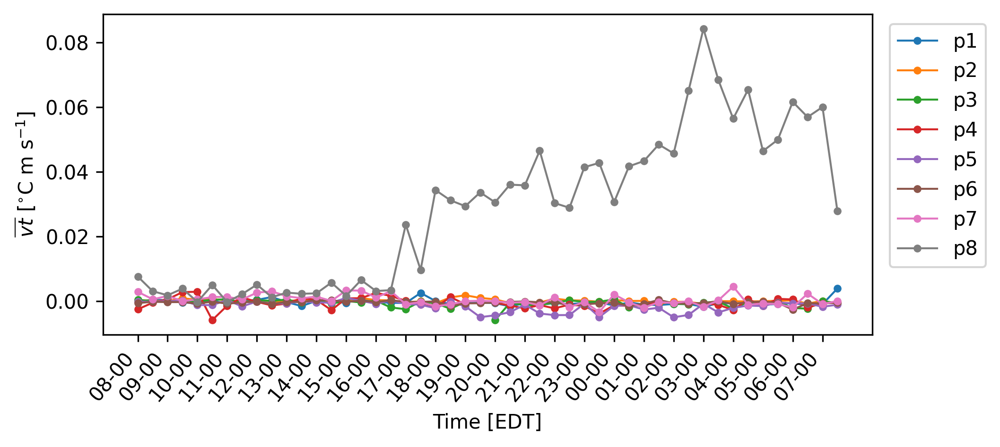

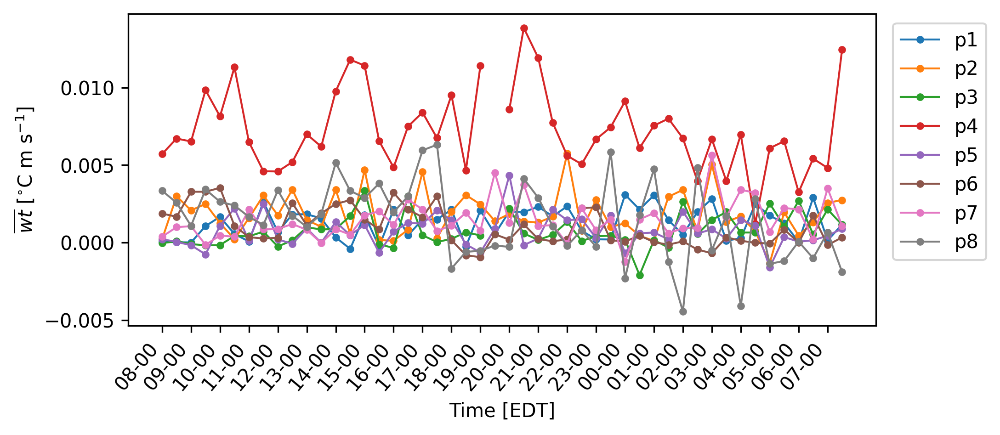

In [15]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{ut}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'VTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{vt}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_VTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'WTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{wt}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_WTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

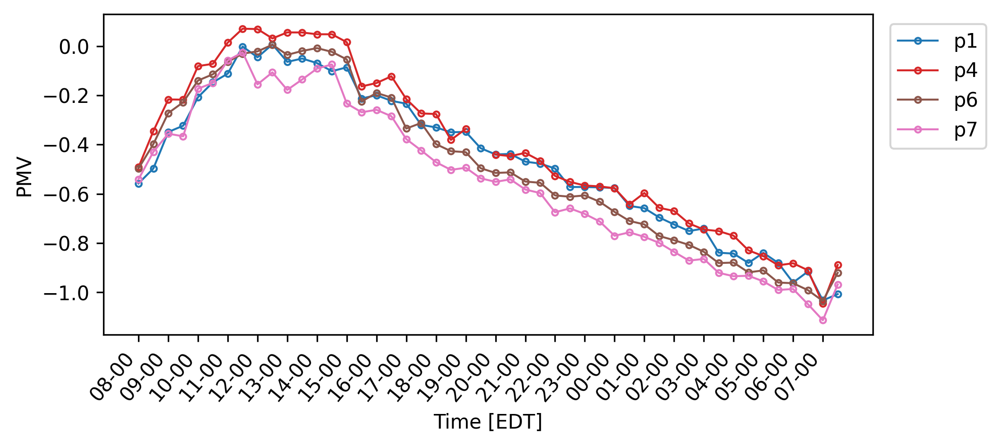

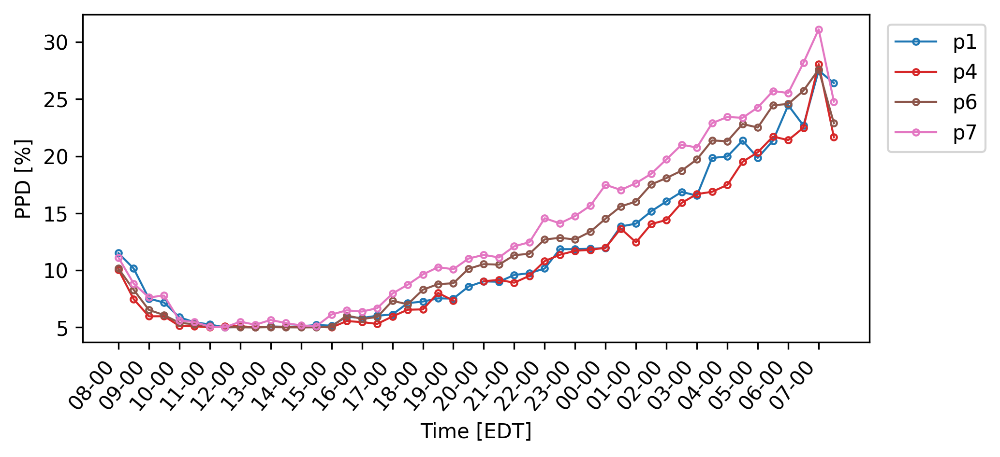

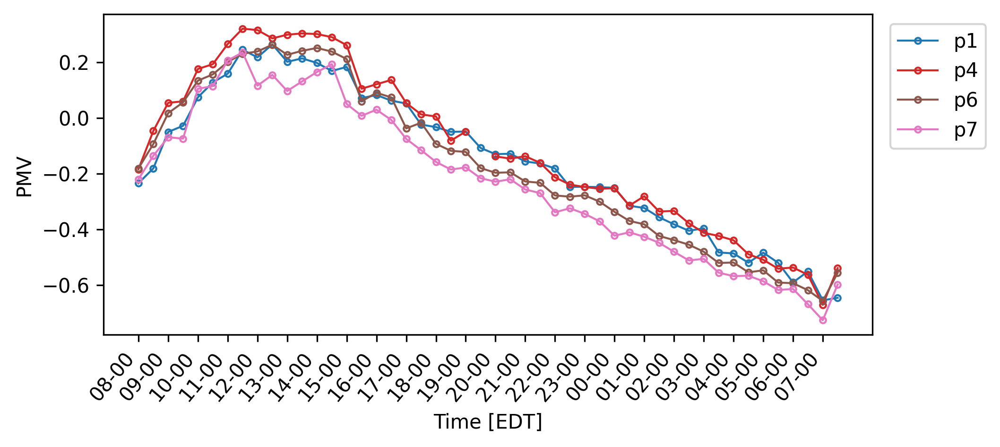

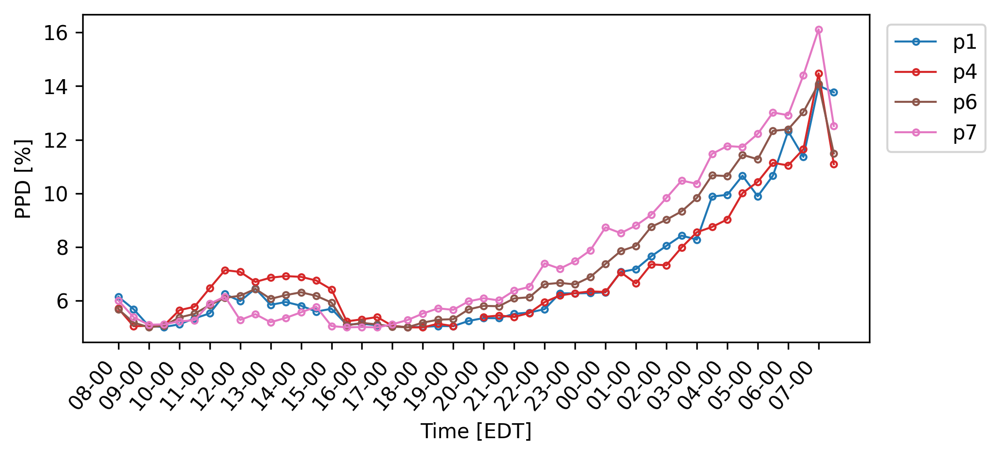

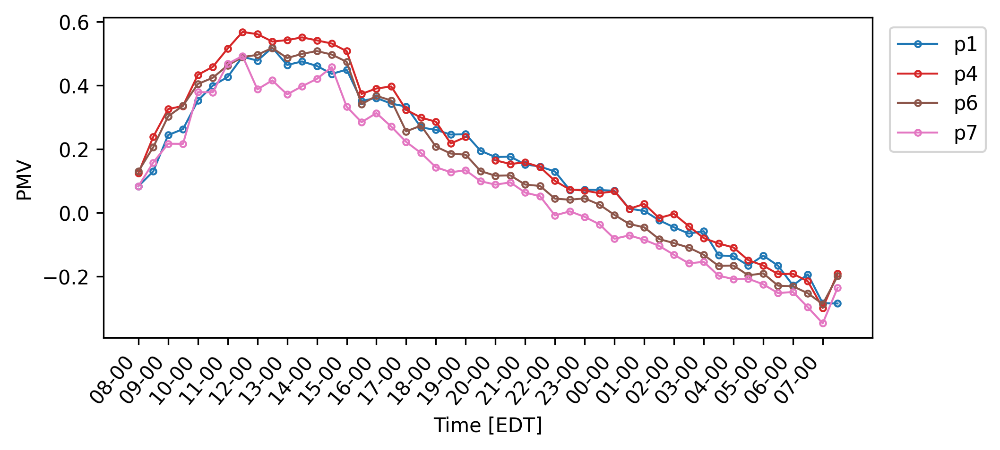

...

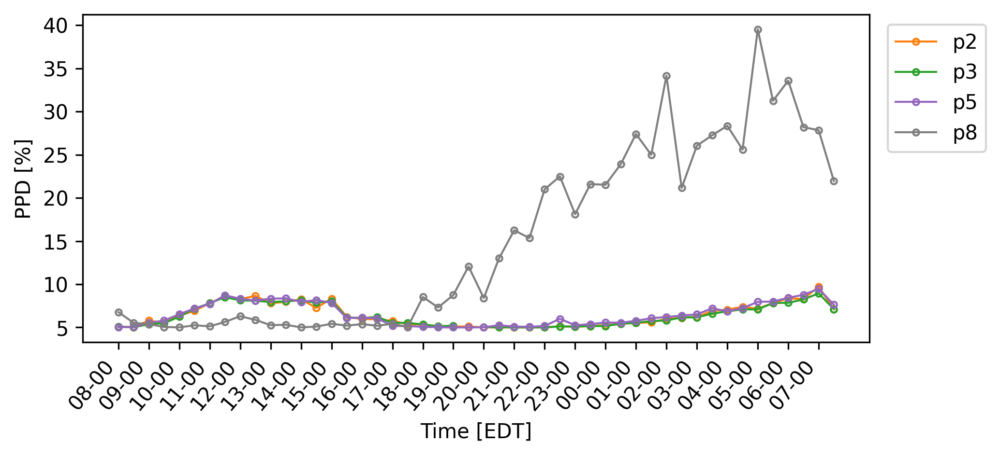

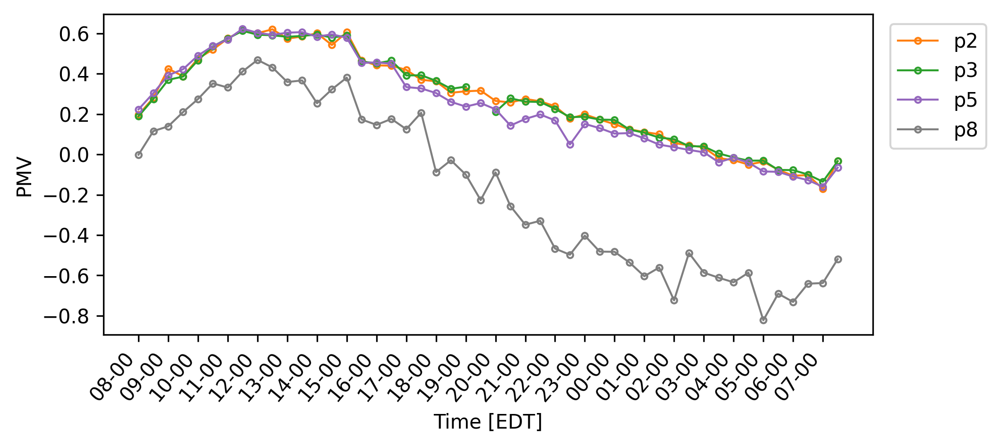

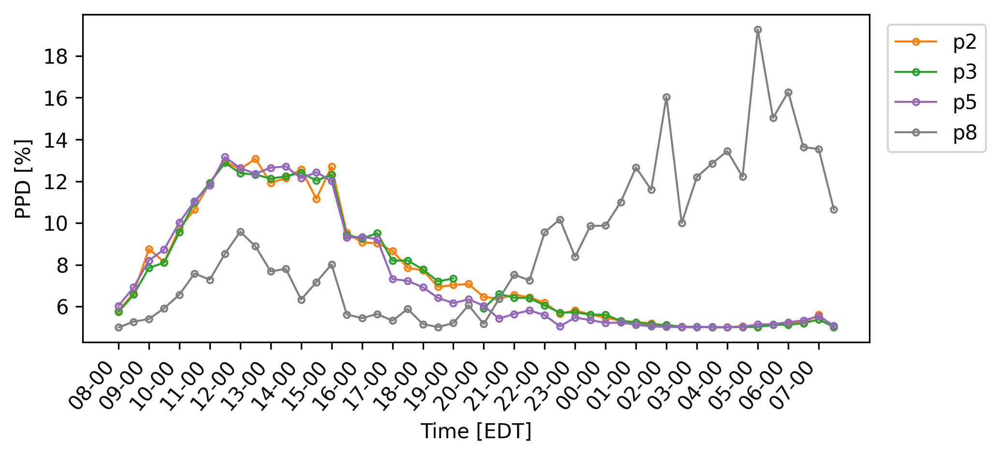

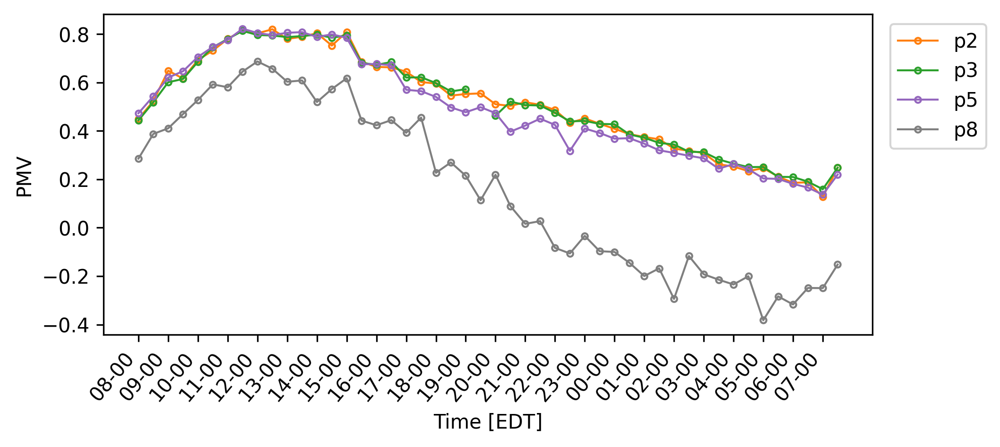

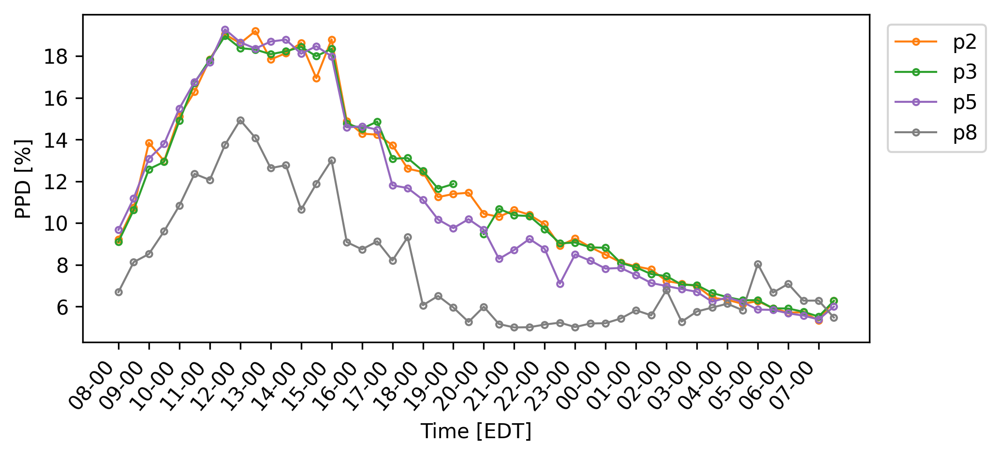

In [16]:
points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}



def PMVfunc(j,points):
    fig = plt.figure(figsize=(7,3),dpi=300)
    ax=plt.subplot(111)
    for i in points:
        ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV'+str(j)],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    plt.ylabel('PMV')
    xlabel = plt.xlabel('Time [EDT]')
    plt.xticks(rotation=50,ha="right")
    lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.xticks(x_axis_labels)
    plt.savefig(figsavepath+'STBE_PMV'+str(j)+'.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
    #plt.show()

def PPDfunc(j,points):
    fig = plt.figure(figsize=(7,3),dpi=300)
    ax=plt.subplot(111)
    for i in points:
        ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD'+str(j)],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    plt.ylabel('PPD [%]')
    xlabel = plt.xlabel('Time [EDT]')
    plt.xticks(rotation=50,ha="right")
    lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.xticks(x_axis_labels)
    plt.savefig(figsavepath+'STBE_PPD'+str(j)+'.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
    #plt.show()
    
for j in range(1,4):
    PMVfunc(j,['p1','p4','p6','p7'])
    PPDfunc(j,['p1','p4','p6','p7'])
    
for j in range(4,7):
    PMVfunc(j,['p2','p3','p5','p8'])
    PPDfunc(j,['p2','p3','p5','p8'])

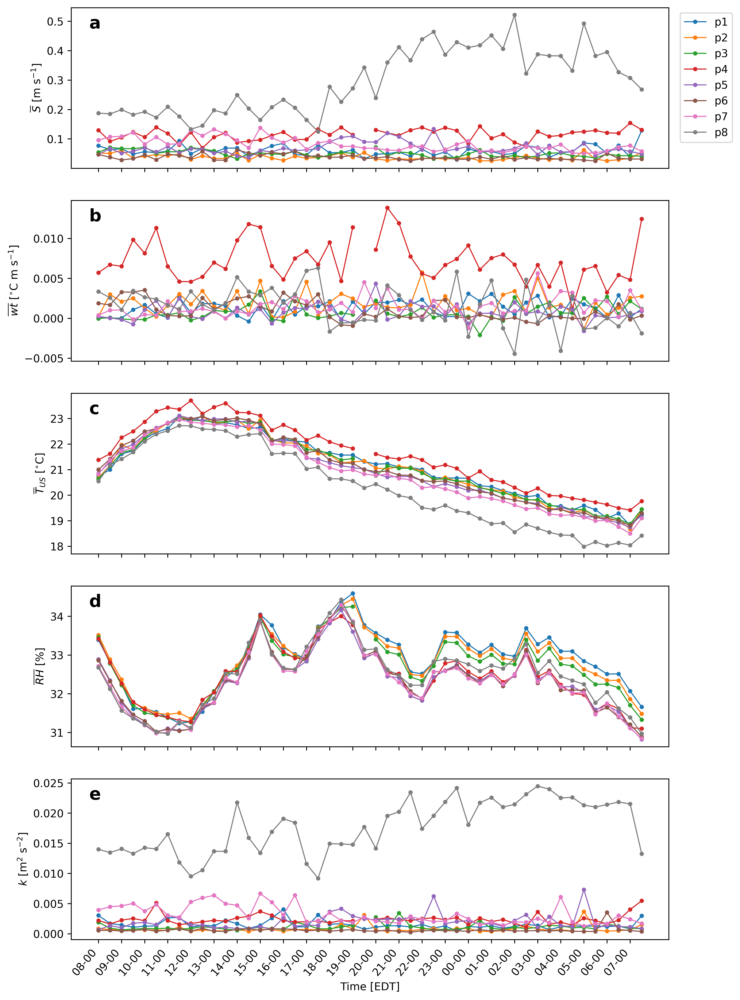

In [62]:
#wind speed
fig=plt.figure(figsize=(10,16),dpi=600)
ax1 = plt.subplot(511)
for i in points:
    ax1.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Savg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{S}$ [m s$^{-1}$]')
#xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax1.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)

#W T covar
#fig = plt.figure(figsize=(7,3),dpi=300)
ax2=plt.subplot(512)
for i in points:
    ax2.plot(files,p_data.loc[pd.IndexSlice[:, i], 'WTvar'],marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{wt}$ [$^{\circ}$C m s$^{-1}$]')
plt.xticks(rotation=50,ha="right")
plt.xticks(x_axis_labels)

#Temperature
#fig = plt.figure(figsize=(7,3),dpi=300)
ax3=plt.subplot(513)
for i in points:
    ax3.plot(files,p_data.loc[pd.IndexSlice[:, i], 'TSonicavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{T}_{US}$ [$^{\circ}$C]')
plt.xticks(rotation=50,ha="right")
plt.xticks(x_axis_labels)


#Relative Humidity
#fig = plt.figure(figsize=(7,3),dpi=300)
ax4=plt.subplot(514)
for i in points:
    ax4.plot(files,p_data.loc[pd.IndexSlice[:, i], 'RHavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{RH}$ [%]')
plt.xticks(rotation=60,ha="right")
plt.xticks(x_axis_labels)

#TKE
#fig = plt.figure(figsize=(7,3),dpi=300)
ax5=plt.subplot(515)
for i in points:
    ax5.plot(files,p_data.loc[pd.IndexSlice[:, i], 'k'],marker = next(marker),linewidth=1)
plt.ylabel(r'$k$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
plt.xticks(x_axis_labels)


ax1.get_shared_x_axes().join(ax1,ax2,ax3,ax4,ax5)
ax1.set_xticklabels([])
ax2.set_xticklabels([])
ax3.set_xticklabels([])
ax4.set_xticklabels([])

ax1.text(0.03, 0.9, 'a', horizontalalignment='left', verticalalignment='center', transform=ax1.transAxes, fontsize=16, fontweight='bold')
ax2.text(0.03, 0.9, 'b', horizontalalignment='left', verticalalignment='center', transform=ax2.transAxes, fontsize=16, fontweight='bold')
ax3.text(0.03, 0.9, 'c', horizontalalignment='left', verticalalignment='center', transform=ax3.transAxes, fontsize=16, fontweight='bold')
ax4.text(0.03, 0.9, 'd', horizontalalignment='left', verticalalignment='center', transform=ax4.transAxes, fontsize=16, fontweight='bold')
ax5.text(0.03, 0.9, 'e', horizontalalignment='left', verticalalignment='center', transform=ax5.transAxes, fontsize=16, fontweight='bold')

plt.savefig(figsavepath+'Superfig.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

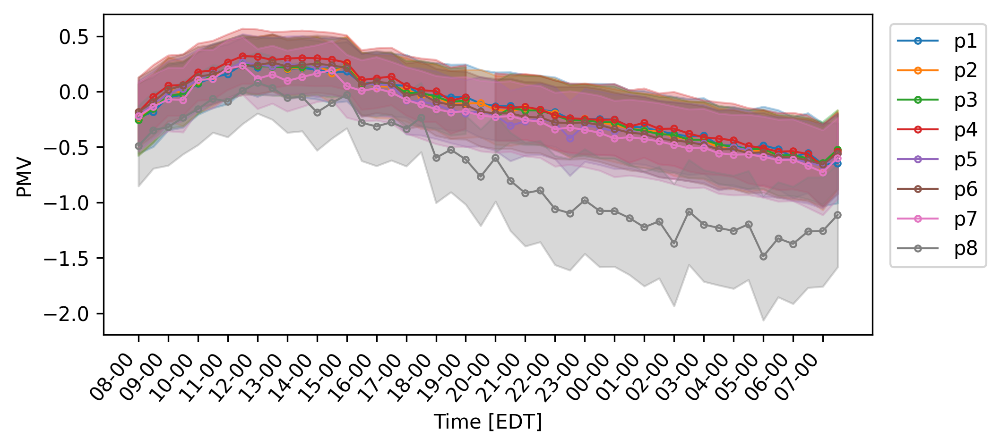

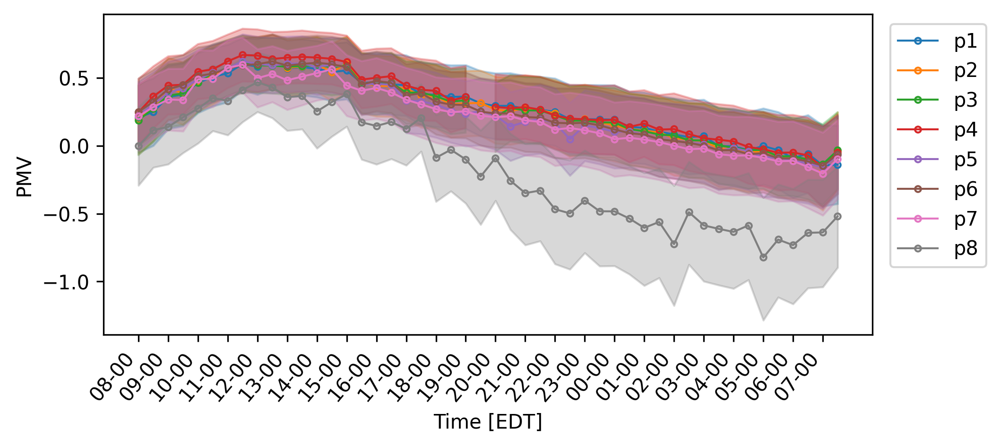

In [17]:
points = ['p1','p2','p3','p4','p5','p6','p7','p8']
#points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV2'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PMV3'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PMV')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PMV1.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


#points = ['p2','p3','p5','p8']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV5'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PMV4'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PMV6'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PMV')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PMV2.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

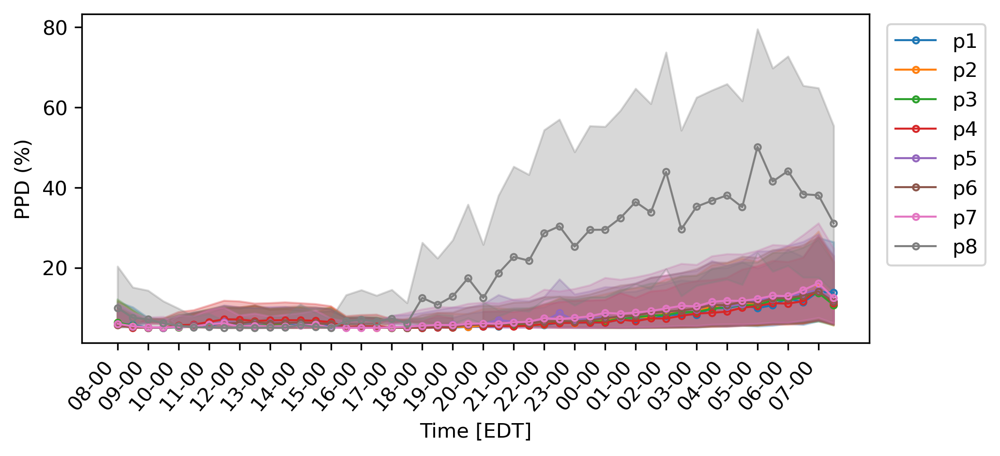

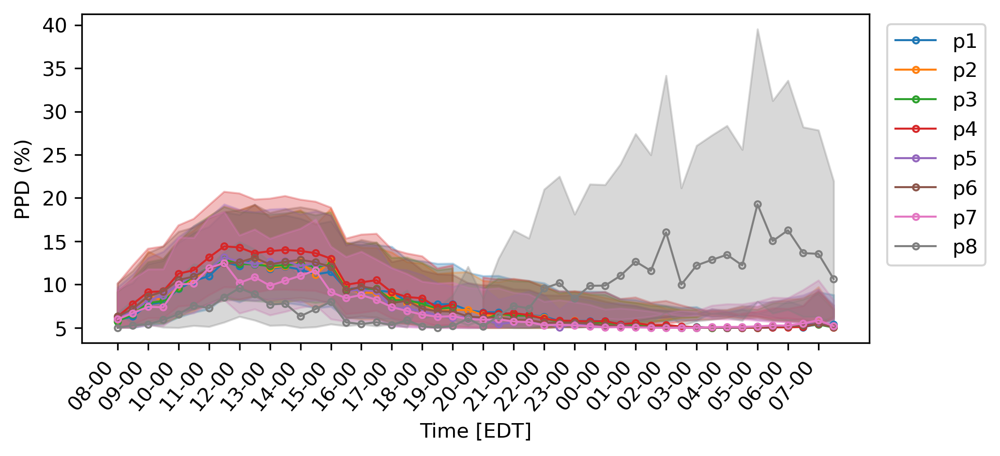

In [23]:
#points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD2'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PPD1'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PPD3'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PPD (%)')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PPD1.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


#points = ['p2','p3','p5','p8']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD5'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PPD4'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PPD6'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PPD (%)')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PPD2.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()